In [2]:
import os
import uproot
import numpy as np
import scipy.signal as signal
from scipy.signal import savgol_filter
import requests
import zipfile
import matplotlib.pyplot as plt




##### for training####
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

#### Data Extraction from root file 

In [20]:
def generate_time_array(initial_time, step_size, voltage_array_size):
    """
    Generates a time array based on initial time, step size, and voltage array size.

    Parameters:
    initial_time (float): The initial time.
    step_size (float): The step size between consecutive time points.
    voltage_array_size (int): The size of the voltage array.

    Returns:
    list: A list containing the generated time array.
    """
    time_array = [initial_time + i * step_size for i in range(voltage_array_size)]
    return time_array

def extract_signal(path_to_Tueros, sim_num, startswith, endswith):
    """
    Extracts signal data from files that match specified criteria.

    Parameters:
    - path_to_Tueros: str. The base directory containing the simulation data.
    - sim_num: list. A list of integers representing the simulation numbers to process.
    - startswith: str. The prefix of the file names to look for.
    - endswith: str. The suffix of the file names to look for.

    Returns:
    - signals: dict. A dictionary where keys are the antenna numbers and values are the extracted signals.
    - time_arrays: dict. A dictionary where keys are the antenna numbers and values are the corresponding time arrays.
    """
    x_dataset = []
    y_dataset = []
    z_dataset = []

    for i in sim_num:
        subdirs = os.listdir(path_to_Tueros)
        path_to_subdir = os.path.join(path_to_Tueros, subdirs[i])
        files = os.listdir(path_to_subdir)

        for file_name in files:
            if file_name.startswith(startswith) and file_name.endswith(endswith):
                path_to_voltage_file = os.path.join(path_to_subdir, file_name)
        voltage_file = uproot.open(path_to_voltage_file)
        voltage_trace = voltage_file['tvoltage;1']['trace'].array()
        # print(f"Shape of voltage_trace: {np.shape(voltage_trace)}")
        antenna_number = np.shape(voltage_trace)[1]
                
        # Assuming the existence of a single .RawRoot file per directory for simplicity
        rawroot_files = [f for f in files if f.endswith(".RawRoot")]
        if rawroot_files:
            path_to_rawroot_file = os.path.join(path_to_subdir, rawroot_files[0])
        rawroot_file = uproot.open(path_to_rawroot_file)

        t_pre = rawroot_file['trawefield;1']['t_pre'].array(library='np')
        # t_post = rawroot_file['trawefield;1']['t_post'].array(library='np')
        # t_bin_size = rawroot_file['trawefield;1']['t_bin_size'].array(library='np')  # replace with the desired value
        t_0 = rawroot_file['trawefield;1']['t_0'].array(library='np') # trigger time 
        time_array = generate_time_array(t_pre,2, 2050)[1:-1]

        time_arrays = [time_array + t_0[0][i] for i in range(antenna_number)]

        # time_array_in_bin = np.arange(t_pre[0], t_post[0], t_bin_size[0])
        # time_array_in_bin = time_array_in_bin[1:-1]
        # time_arrays_in_bin = [time_array_in_bin + t_0[0][i] for i in range(antenna_number)] 
        # print('t_bin_size=',t_bin_size[0],'ns')
        # print('time_arrays_in_bin[0]=',time_arrays_in_bin[0], 'ns, ', 'size=', np.size(time_arrays_in_bin[0]))
        # print('time_arrays_in_bin[1]=',time_arrays_in_bin[1], 'ns, ', 'size=', np.size(time_arrays_in_bin[1]))
        
        antenna_dir = os.path.join(path_to_subdir, 'antenna_files')
        os.makedirs(antenna_dir, exist_ok=True)

        for k in range(antenna_number):
            filename = os.path.join(antenna_dir, f'antenna_{k}.txt')

            with open(filename, 'w') as file:
                
                file.write('#Timing [ns],Trace_X [V],Trace_Y [V],Trace_Z [V],x_snr,y_snr,z_snr\n')
                for j in range(len(time_arrays[k])):
                    file.write(f'{time_arrays[k][j]},{voltage_trace[0][k][0][j]},{voltage_trace[0][k][1][j]},{voltage_trace[0][k][2][j]}\n')
                    
            data = np.loadtxt(filename, delimiter=',', converters={0: lambda x: float(x.strip('[]'))}, encoding='utf-8-sig')

            # Extract the columns
            
            time = data[:, 0]
            trace_x = data[:, 1]
            trace_y = data[:, 2]
            trace_z = data[:, 3]

            # plt.figure()
            # plt.plot(time, trace_x, label=f'Trace X')
            # plt.plot(time, trace_y, label=f'Trace Y')
            # plt.plot(time, trace_z, label=f'Trace Z')
            # plt.xlabel(f'Timing [ns]')
            # plt.ylabel(f'Trace [V]')
            # plt.title(f'Antenna {k} - Timing vs Traces')
            # plt.legend()
            # plt.show()

            x_dataset.append(trace_x)
            y_dataset.append(trace_y)
            z_dataset.append(trace_z)

    return time, x_dataset , y_dataset, z_dataset

sim_num = [i for i in range(9)] 
path_to_Tueros = 'C:/Users/Owner/Desktop/DC2Alpha/'
clean_time, clean_trace_x, clean_trace_y, clean_trace_z = extract_signal(path_to_Tueros, sim_num, "tvoltage", "with-rf_no-noise.root")
noised_time, noised_trace_x, noised_trace_y, noised_trace_z = extract_signal(path_to_Tueros, sim_num, "tvoltage", "with-rf_with-noise.root")

print(f'shape of clean_time:{np.shape(clean_time)}')
print(f'shape of clean_trace_x:{np.shape(clean_trace_x)}')
print(f'shape of clean_trace_y:{np.shape(clean_trace_y)}')
print(f'shape of clean_trace_z:{np.shape(clean_trace_z)}')
print(f'shape of noised_time:{np.shape(noised_time)}')
print(f'shape of noised_trace_x:{np.shape(noised_trace_x)}')
print(f'shape of noised_trace_y:{np.shape(noised_trace_y)}')
print(f'shape of noised_trace_z:{np.shape(noised_trace_z)}')


shape of clean_time:(2048,)
shape of clean_trace_x:(785, 2048)
shape of clean_trace_y:(785, 2048)
shape of clean_trace_z:(785, 2048)
shape of noised_time:(2048,)
shape of noised_trace_x:(785, 2048)
shape of noised_trace_y:(785, 2048)
shape of noised_trace_z:(785, 2048)


In [21]:
from different_metrices import train_and_validate_model
from different_metrices import calculate_psnr_with_peak
from different_metrices import peak_to_peak_ratio
from different_metrices import get_reconstructed_signals
from different_metrices import visualize_denoised_signal
from different_metrices import psnr_loss
from different_metrices import plot_loss_vs_psnr
from different_metrices import plot_metrics



import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import os
import pandas as pd
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import torch.nn.functional as F
import numpy as np
from scipy.signal import hilbert
from skimage.metrics import peak_signal_noise_ratio as psnr
from torch.optim.lr_scheduler import CyclicLR


### ResNet


In [22]:
class ResidualBlock(nn.Module):
    """
    encoder: 2 1-d convolution layers in one block. There are 3 blocks in the encoder.

    decoder: 2 1-d convotranspose layers in one block.  There are 3 blocks in the decoder.
    """
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size, stride=stride, padding=padding)

        # Adjust channels in skip connection if necessary
        self.adjust_channels = nn.Conv1d(in_channels, out_channels, 1) if in_channels != out_channels else None

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)

        # Apply the skip connection
        if self.adjust_channels is not None:
            identity = self.adjust_channels(identity)

        out += identity
        out = self.relu(out)
        return out
    
class DecoderResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding, output_padding):
        super(DecoderResidualBlock, self).__init__()
        self.conv1 = nn.ConvTranspose1d(in_channels, out_channels, kernel_size, stride=2, padding=padding, output_padding=output_padding)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.ConvTranspose1d(out_channels, out_channels, kernel_size, stride=1, padding=padding)

        # Adjust channels in skip connection if necessary
        self.adjust_channels = nn.ConvTranspose1d(in_channels, out_channels, 1, stride=2, output_padding=output_padding) if in_channels != out_channels else None

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)

        # Apply the skip connection
        if self.adjust_channels is not None:
            identity = self.adjust_channels(identity)

        out += identity
        out = self.relu(out)
        return out
    
class Autoencoder(nn.Module):
    def __init__(self, input_size=1024, kernel_size=3):
        super(Autoencoder, self).__init__()
        kernel_size = kernel_size + 1 if kernel_size % 2 == 0 else kernel_size
        padding = kernel_size // 2

        # Encoder with Residual Blocks
        self.encoder = nn.Sequential(
            ResidualBlock(3, 32, kernel_size, stride=1, padding=padding),
            nn.MaxPool1d(2, stride=2),
            ResidualBlock(32, 64, kernel_size, stride=1, padding=padding),
            nn.MaxPool1d(2, stride=2),
            ResidualBlock(64, 128, kernel_size, stride=1, padding=padding),
            nn.MaxPool1d(2, stride=2)
        )

        # Decoder
        self.decoder = nn.Sequential(
            DecoderResidualBlock(128, 64, kernel_size, padding=kernel_size//2, output_padding=1),
            DecoderResidualBlock(64, 32, kernel_size, padding=kernel_size//2, output_padding=1),
            nn.ConvTranspose1d(32, 3, kernel_size, stride=2, padding=kernel_size//2, output_padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


def split_indices(n, train_frac=0.7, valid_frac=0.15):
    """Split indices into training, validation, and test sets."""
    indices = np.arange(n)
    np.random.shuffle(indices)

    train_size = int(n * train_frac)
    valid_size = int(n * valid_frac)

    train_indices = indices[:train_size]
    valid_indices = indices[train_size:train_size + valid_size]
    test_indices = indices[train_size + valid_size:]

    return train_indices, valid_indices, test_indices


class CustomDataset(Dataset):
    def __init__(self, noised_signals, clean_signals, indices=None):
        """
        Args:
            noised_signals: Tuple of lists containing noised X, Y, Z signal components.
            clean_signals: Tuple of lists containing clean X, Y, Z signal components.
            indices: Array-like list of indices specifying which samples to include.
        """
        self.indices = indices if indices is not None else list(range(len(noised_signals[0])))

        # Ensure we access the signals using indices correctly
        self.noised_signals = noised_signals
        self.clean_signals = clean_signals

    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, idx):
        # Fetch the correct index for the current sample
        actual_idx = self.indices[idx]

        # Properly access the sample data
        noised_signal = np.stack([self.noised_signals[i][actual_idx] for i in range(3)], axis=0)
        clean_signal = np.stack([self.clean_signals[i][actual_idx] for i in range(3)], axis=0)

        return torch.tensor(noised_signal, dtype=torch.float32), torch.tensor(clean_signal, dtype=torch.float32)


In [23]:
noised_signals = (noised_trace_x, noised_trace_y, noised_trace_z)
clean_signals = (clean_trace_x, clean_trace_y, clean_trace_z)

total_samples = len(noised_trace_x)  # Assuming the lengths of all signal lists are the same.
train_indices, valid_indices, test_indices = split_indices(total_samples)

train_dataset = CustomDataset(noised_signals, clean_signals, indices=train_indices)
valid_dataset = CustomDataset(noised_signals, clean_signals, indices=valid_indices)
test_dataset = CustomDataset(noised_signals, clean_signals, indices=test_indices)

# Creating DataLoader instances for each dataset
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)


#### Parameters


Device set to : cuda:0
Epoch 1/200, Training Loss: 1.7723, Validation Loss: 2.4014, Validation PSNR: 8.72, Validation Peak-to-Peak: 0.25, Learning Rate: 0.000500
Epoch 2/200, Training Loss: 0.4271, Validation Loss: -1.7847, Validation PSNR: 8.75, Validation Peak-to-Peak: 0.23, Learning Rate: 0.000500
Epoch 3/200, Training Loss: -4.5267, Validation Loss: -3.8662, Validation PSNR: 8.97, Validation Peak-to-Peak: 0.20, Learning Rate: 0.000500
Epoch 4/200, Training Loss: -5.9840, Validation Loss: -3.4361, Validation PSNR: 9.08, Validation Peak-to-Peak: 0.19, Learning Rate: 0.000500
Epoch 5/200, Training Loss: -7.4291, Validation Loss: -3.9659, Validation PSNR: 9.16, Validation Peak-to-Peak: 0.18, Learning Rate: 0.000500
Epoch 6/200, Training Loss: -8.1984, Validation Loss: -8.3560, Validation PSNR: 9.50, Validation Peak-to-Peak: 0.09, Learning Rate: 0.000500
Epoch 7/200, Training Loss: -9.1607, Validation Loss: -5.4244, Validation PSNR: 9.49, Validation Peak-to-Peak: 0.16, Learning Rate: 0.

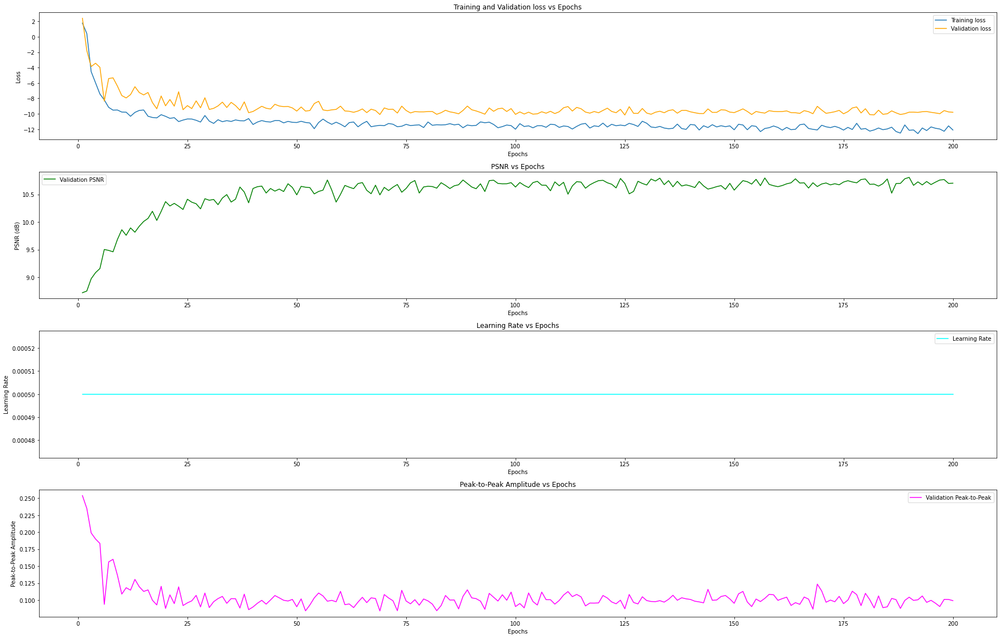

In [27]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Device set to : {device}')
num_epochs =200
base_lr = 0.0005 
max_lr = 0.006 
model = Autoencoder(kernel_size=3).to(device)
optimizer = optim.NAdam(model.parameters(), lr=base_lr)
scheduler = CyclicLR(optimizer, base_lr=base_lr, max_lr=max_lr, 
                     step_size_up=5, step_size_down=20, 
                     mode='triangular', cycle_momentum=False)
criterion = psnr_loss


training_losses, validation_losses, validation_psnr, learning_rates, validation_peak_to_peak = [], [], [], [], []
for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0
    for noisy_data, clean_data in train_loader:  # Correct iteration over DataLoader
        noisy_data, clean_data = noisy_data.to(device), clean_data.to(device)
        optimizer.zero_grad()
        outputs = model(noisy_data)
        loss = criterion(outputs, clean_data)
        loss.backward()
        optimizer.step()
        # scheduler.step()  
        total_train_loss += loss.item()
    
    avg_train_loss = total_train_loss / len(train_loader.dataset)
    training_losses.append(avg_train_loss)

    model.eval()
    total_valid_loss, total_psnr, total_peak_to_peak_ratio = 0, 0, 0
    for noisy_data, clean_data in valid_loader:  # Assuming validation_dataset is a DataLoader
        clean_data, noisy_data = clean_data.to(device), noisy_data.to(device)
        with torch.no_grad():
            outputs = model(noisy_data)
            loss = criterion(outputs, clean_data)
            total_valid_loss += loss.item()
            psnr_value = calculate_psnr_with_peak(clean_data.cpu().numpy(), outputs.cpu().numpy())
            total_psnr += psnr_value
            ratio = peak_to_peak_ratio(clean_data.cpu().numpy(), outputs.cpu().numpy())
            total_peak_to_peak_ratio += ratio

    avg_valid_loss = total_valid_loss / len(valid_loader.dataset)
    validation_losses.append(avg_valid_loss)
    avg_psnr = total_psnr / len(valid_loader.dataset)
    validation_psnr.append(avg_psnr)
    avg_peak_to_peak_ratio = total_peak_to_peak_ratio / len(valid_loader.dataset)
    validation_peak_to_peak.append(avg_peak_to_peak_ratio)
    learning_rates.append(scheduler.get_last_lr()[0])

    print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {avg_train_loss:.4f}, Validation Loss: {avg_valid_loss:.4f}, Validation PSNR: {avg_psnr:.2f}, Validation Peak-to-Peak: {avg_peak_to_peak_ratio:.2f}, Learning Rate: {learning_rates[-1]:.6f}')

epochs = range(1, num_epochs + 1)

plot_metrics(epochs, training_losses, validation_losses, validation_psnr, learning_rates= learning_rates, validation_peak_to_peak = validation_peak_to_peak)

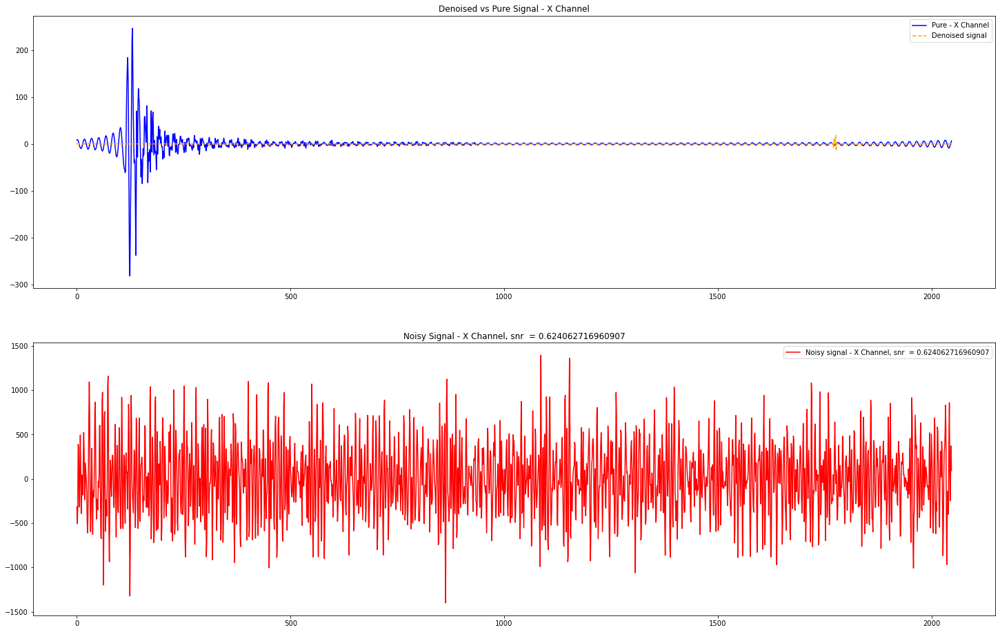

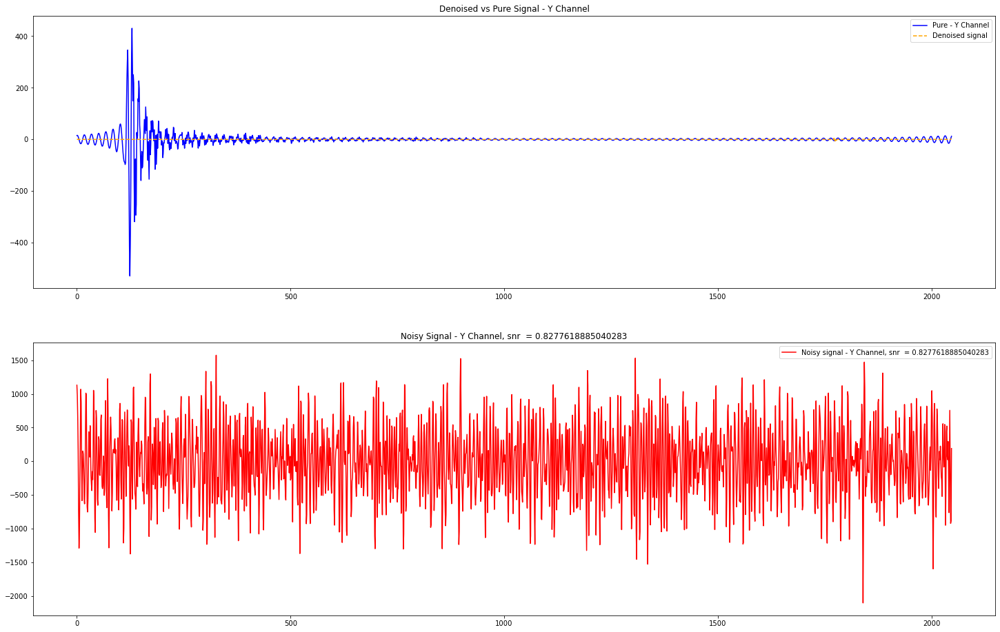

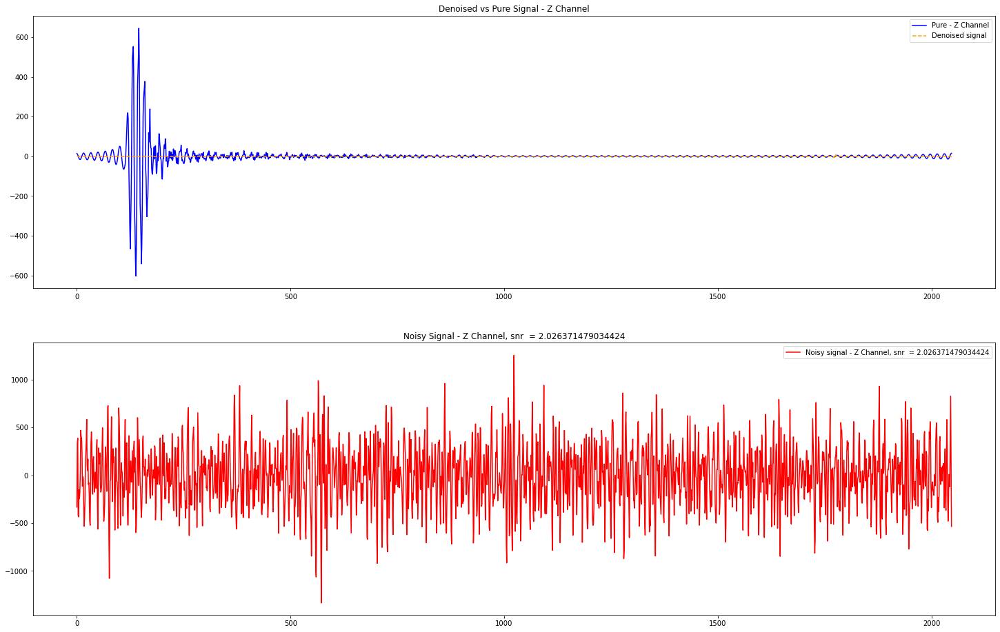

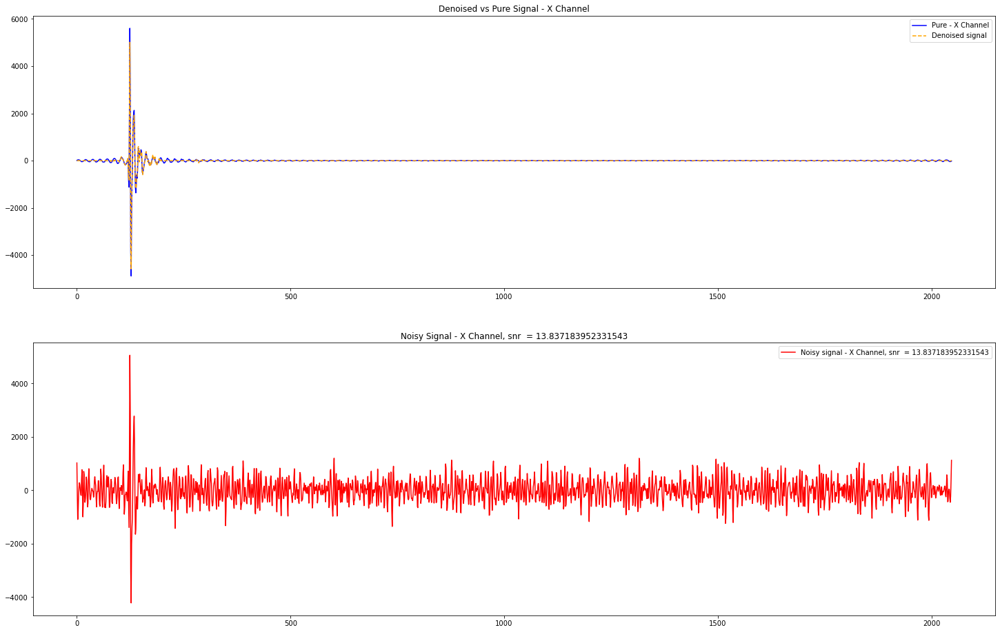

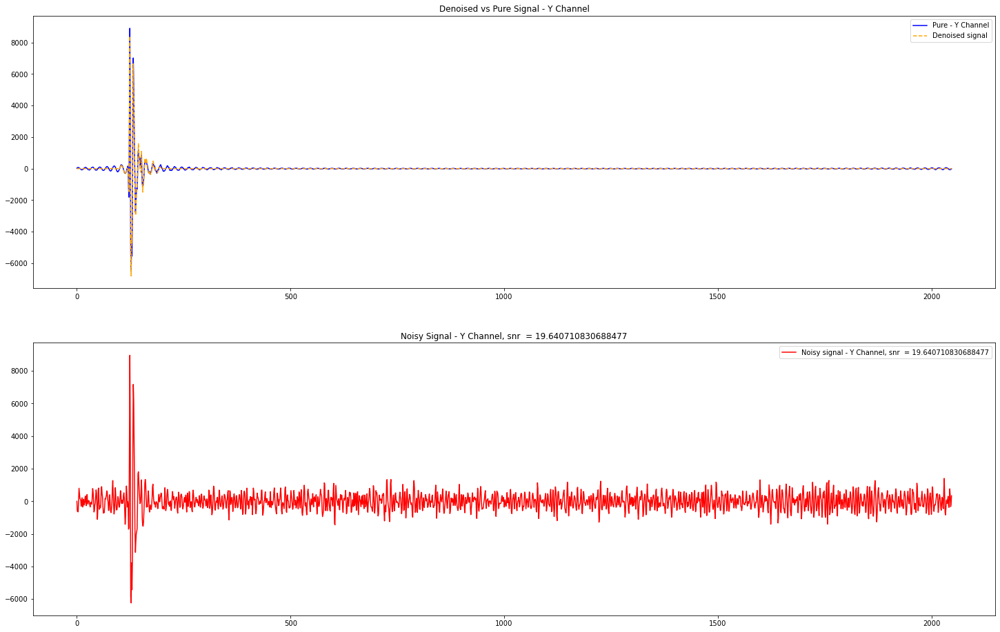

...

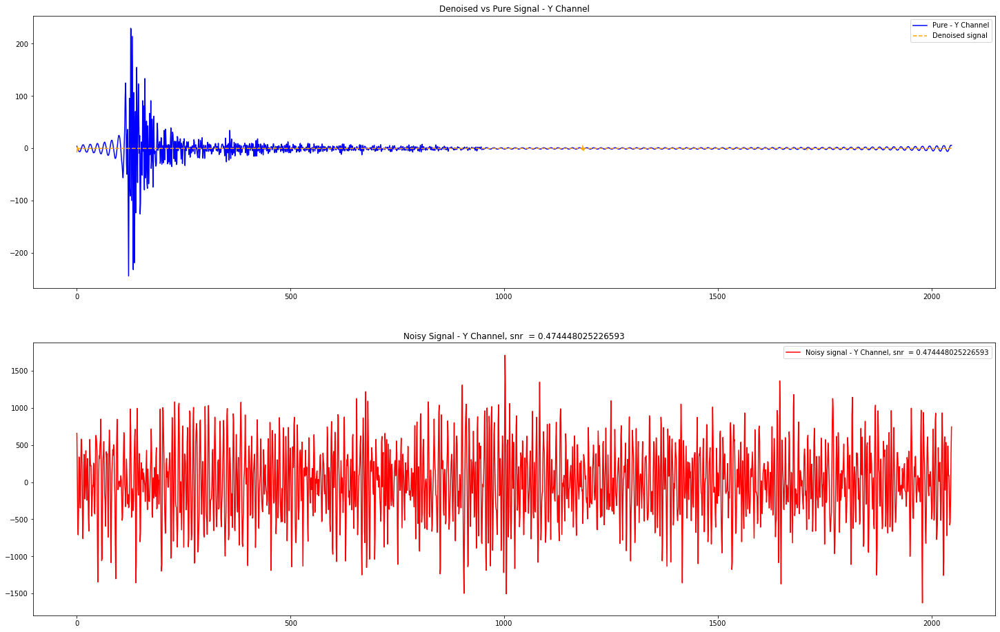

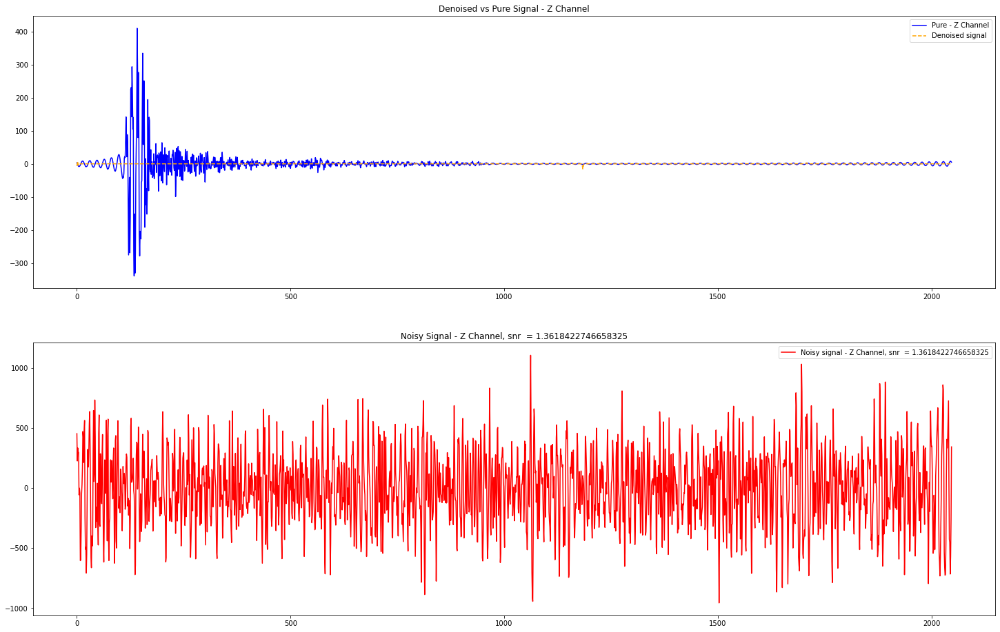

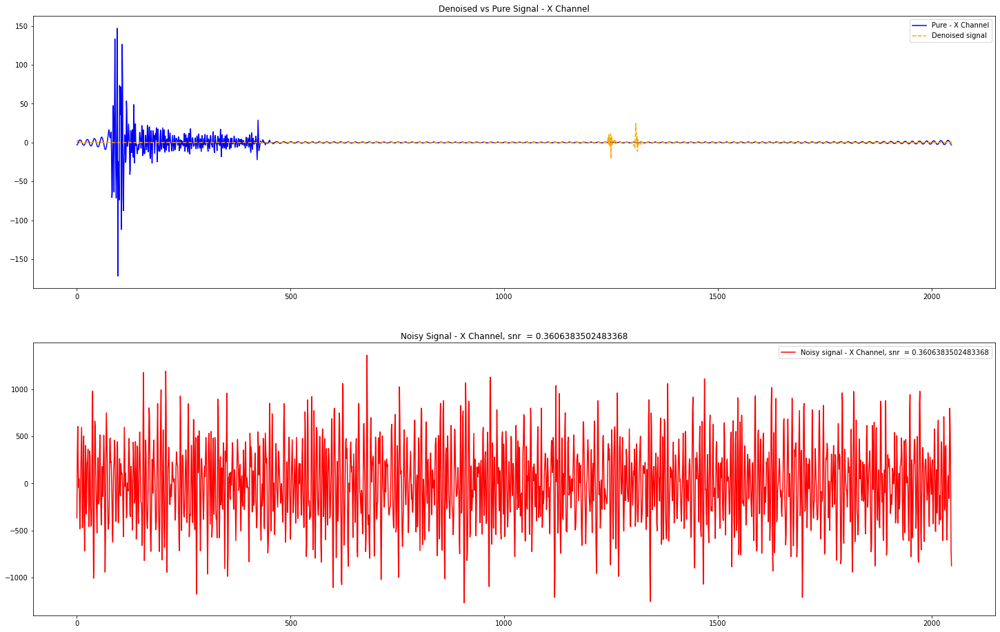

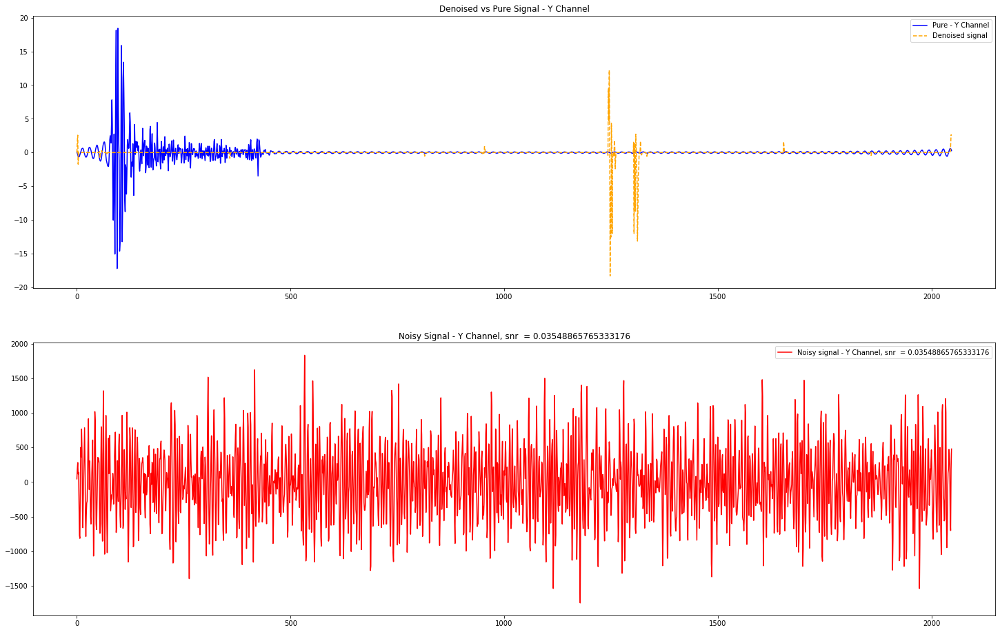

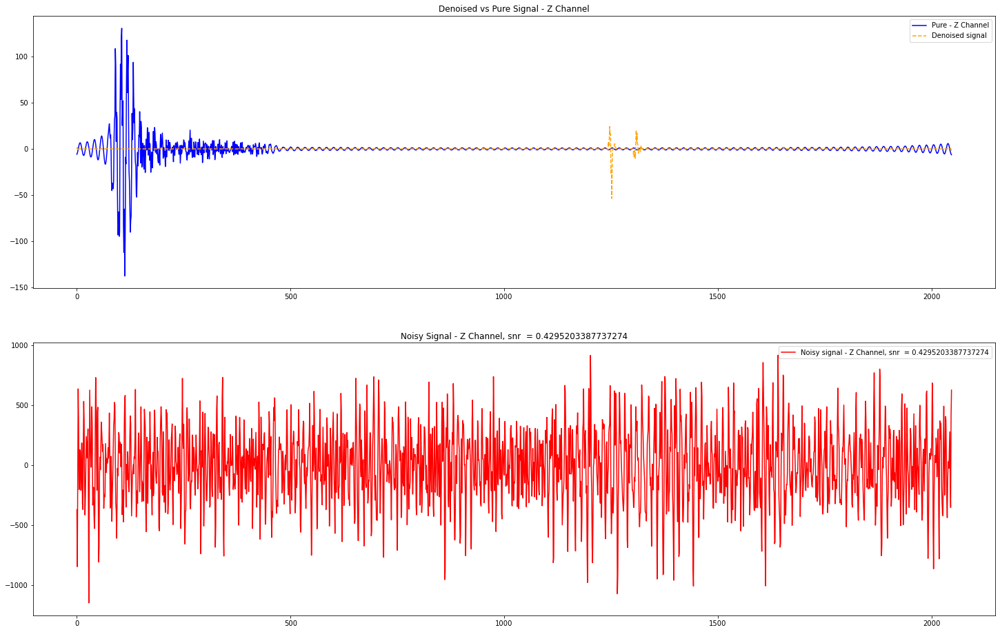

In [28]:
device = torch.device("cpu")
model = model.to(device)  # Move model to the specified device
model.eval()  # Set model to evaluation mode

with torch.no_grad():  # Disabling gradient calculation
        # Move data to the specified device and ensure you're using the moved data
        for noisy_data, clean_data in test_loader:
            
            noisy_data, clean_data = noisy_data.to(device), clean_data.to(device)
        
            # Now that both data and model are on the same device, perform the forward pass
            denoised_output = model(noisy_data)
            
            # Assuming you only want to plot the first sample in the batch for brevity
            sample_idx = 0  # Index of the sample to plot
            channel_names = ['X Channel', 'Y Channel', 'Z Channel']
            
            for channel_idx in range(3):  # Assuming 3 channels: X, Y, Z
                clean_np = clean_data[sample_idx, channel_idx].cpu().numpy()
                noisy_np = noisy_data[sample_idx, channel_idx].cpu().numpy()
                snr = np.max(clean_np) / np.std(noisy_np - clean_np)
                plt.figure(figsize=(25, 16))  # Set figure size for each channel
                
                # Plot the pure (clean) signal for the current channel
                plt.subplot(2, 1, 1)
                plt.plot(clean_data[sample_idx, channel_idx].cpu(), label=f'Pure - {channel_names[channel_idx]}', color='blue')
                plt.plot(denoised_output[sample_idx, channel_idx].cpu(), label='Denoised signal', linestyle='--', color='orange')
                plt.legend()
                plt.title(f'Denoised vs Pure Signal - {channel_names[channel_idx]}')

                # Plot the noisy signal for the current channel
                plt.subplot(2, 1, 2)
                plt.plot(noisy_data[sample_idx, channel_idx].cpu(), label=f'Noisy signal - {channel_names[channel_idx]}, snr  = {snr}', color='red')
                plt.legend()
                plt.title(f'Noisy Signal - {channel_names[channel_idx]}, snr  = {snr}')

                plt.show()
